In [1]:
!pip install transformers
!pip install diffusers

In [ ]:
!huggingface-cli login


    _|    _|  _|    _|    _|_|_|    _|_|_|  _|_|_|  _|      _|    _|_|_|      _|_|_|_|    _|_|      _|_|_|  _|_|_|_|
    _|    _|  _|    _|  _|        _|          _|    _|_|    _|  _|            _|        _|    _|  _|        _|
    _|_|_|_|  _|    _|  _|  _|_|  _|  _|_|    _|    _|  _|  _|  _|  _|_|      _|_|_|    _|_|_|_|  _|        _|_|_|
    _|    _|  _|    _|  _|    _|  _|    _|    _|    _|    _|_|  _|    _|      _|        _|    _|  _|        _|
    _|    _|    _|_|      _|_|_|    _|_|_|  _|_|_|  _|      _|    _|_|_|      _|        _|    _|    _|_|_|  _|_|_|_|

    A token is already saved on your machine. Run `huggingface-cli whoami` to get more information or `huggingface-cli logout` if you want to log out.
    Setting a new token will erase the existing one.
    To login, `huggingface_hub` requires a token generated from https://huggingface.co/settings/tokens .
Enter your token (input will not be visible): 
Add token as git credential? (Y/n) y
Token is valid (permission: fineGr

In [2]:
from diffusers import DiffusionPipeline

pipe = DiffusionPipeline.from_pretrained("stabilityai/stable-diffusion-2")
pipe.to("cuda")

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/537 [00:00<?, ?B/s]

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/345 [00:00<?, ?B/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/824 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/633 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.36G [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/611 [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/909 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.46G [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


StableDiffusionPipeline {
  "_class_name": "StableDiffusionPipeline",
  "_diffusers_version": "0.30.3",
  "_name_or_path": "stabilityai/stable-diffusion-2",
  "feature_extractor": [
    "transformers",
    "CLIPImageProcessor"
  ],
  "image_encoder": [
    null,
    null
  ],
  "requires_safety_checker": false,
  "safety_checker": [
    null,
    null
  ],
  "scheduler": [
    "diffusers",
    "DDIMScheduler"
  ],
  "text_encoder": [
    "transformers",
    "CLIPTextModel"
  ],
  "tokenizer": [
    "transformers",
    "CLIPTokenizer"
  ],
  "unet": [
    "diffusers",
    "UNet2DConditionModel"
  ],
  "vae": [
    "diffusers",
    "AutoencoderKL"
  ]
}

In [3]:
import torch
import matplotlib.pyplot as plt

In [ ]:
torch.manual_seed(42)

In [ ]:
#  def generate_image(prompt):
#   image = pipe(prompt).images[0]
#   return image

## Generating Images with Different Inference Steps

In [4]:
def generate_image(num_steps, prompt):
    return pipe(prompt, num_inference_steps=num_steps).images[0]


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/80 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/150 [00:00<?, ?it/s]

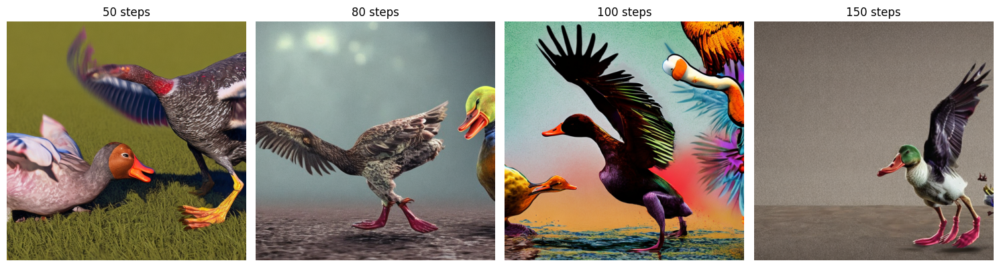

In [ ]:
steps_list = [50, 80, 100, 150]
images = [generate_image(steps, prompt="Realistic image of a duck fighting with a zombie in 4K with vibrant colors") for steps in steps_list]

# Plot images side by side for comparison
fig, axes = plt.subplots(1, len(steps_list), figsize=(15, 5))

for i, (steps, image) in enumerate(zip(steps_list, images)):
    axes[i].imshow(image)
    axes[i].set_title(f"{steps} steps")
    axes[i].axis('off')  # Hide the axes for clarity

plt.tight_layout()
plt.show()

In [5]:
# generate_image("Realistic image of a duck fighting with a zombie duck in 4K with vibrant colors")

## Generating Images with Different Guidance Values

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

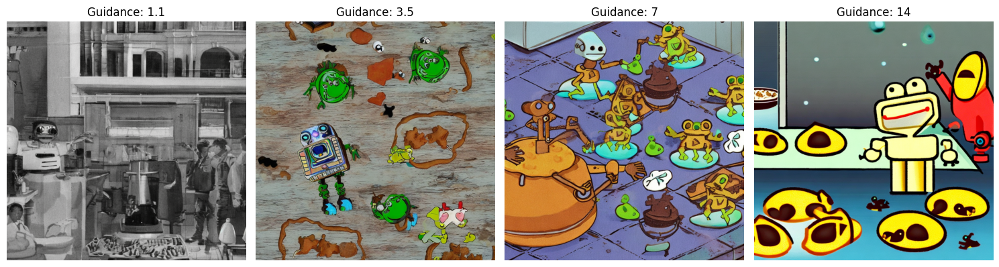

In [ ]:
def generate_image(guidance_scale, prompt):
    return pipe(prompt, guidance_scale=guidance_scale).images[0]

guidance_values = [1.1, 3.5, 7, 14]
images = [generate_image(scale, prompt="A robot baking cookies with a bunch of curious frogs watching") for scale in guidance_values]

# Plot images side by side for comparison
fig, axes = plt.subplots(1, len(guidance_values), figsize=(15, 5))

for i, (scale, image) in enumerate(zip(guidance_values, images)):
    axes[i].imshow(image)
    axes[i].set_title(f"Guidance: {scale}")
    axes[i].axis('off')  # Hide the axes for clarity

plt.tight_layout()
plt.show()

## Generating Images with a Negative Prompt

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

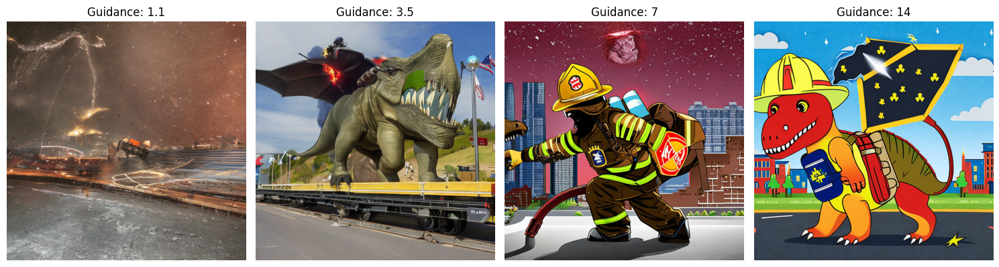

In [ ]:
prompt = "A dinosaur dressed as a firefighter saving a city from a meteor shower"
negative_prompt = "blurry, distorted, low quality, abstract"

def generate_image(guidance_scale):
    return pipe(prompt, negative_prompt=negative_prompt, guidance_scale=guidance_scale, strength=0.2).images[0]

# Generate images with different guidance values
guidance_values = [1.1, 3.5, 7, 14]
images = [generate_image(scale) for scale in guidance_values]

fig, axes = plt.subplots(1, len(guidance_values), figsize=(15, 5))

for i, (scale, image) in enumerate(zip(guidance_values, images)):
    axes[i].imshow(image)
    axes[i].set_title(f"Guidance: {scale}")
    axes[i].axis('off')

plt.tight_layout()
plt.show()

## Generating Images from Sketch

In [13]:
from PIL import Image

def image_to_image(sketch_path, prompt, num_images=2):
  sketch = Image.open(sketch_path).resize((512, 512))

  images = pipe(prompt=prompt, num_images_per_prompt=num_images, image=sketch, strength=1, num_inference_steps=70).images

  fig, axes = plt.subplots(1, num_images+1, figsize=(20, 5))
  axes[0].imshow(sketch)
  axes[0].set_title("Original Sketch")
  axes[0].axis('off')

  for i, image in enumerate(images, 1):
      axes[i].imshow(image)
      axes[i].set_title(f"Generated Image {i}")
      axes[i].axis('off')

  plt.tight_layout()
  plt.show()

  0%|          | 0/50 [00:00<?, ?it/s]

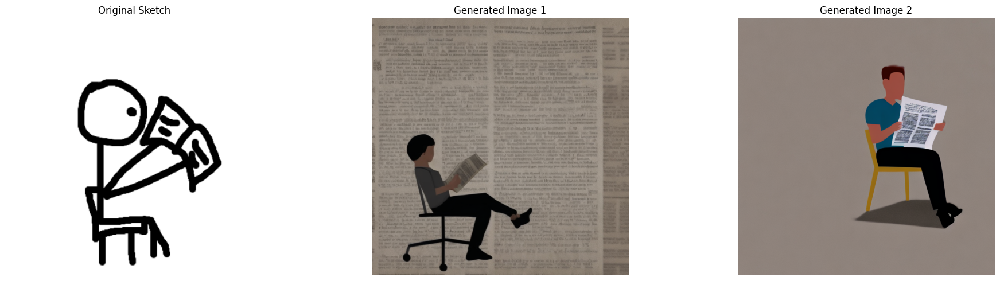

In [11]:
sketch_path = "/content/test.png"
prompt = "A person reading newspaper, sitting on a chair, photorealistic 4K"
image_to_image(sketch_path, prompt)

  0%|          | 0/50 [00:00<?, ?it/s]

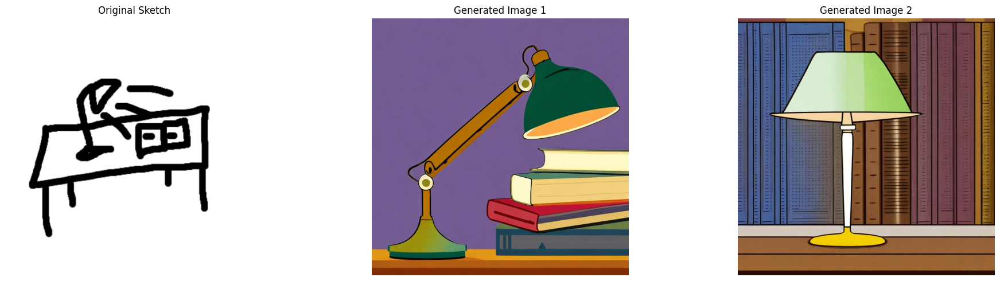

In [12]:
sketch_path = "/content/test_1.png"
prompt = "A table lamp on a table, focused on a book, 90s style cartoon"
image_to_image(sketch_path, prompt)

  0%|          | 0/70 [00:00<?, ?it/s]

  0%|          | 0/70 [00:00<?, ?it/s]

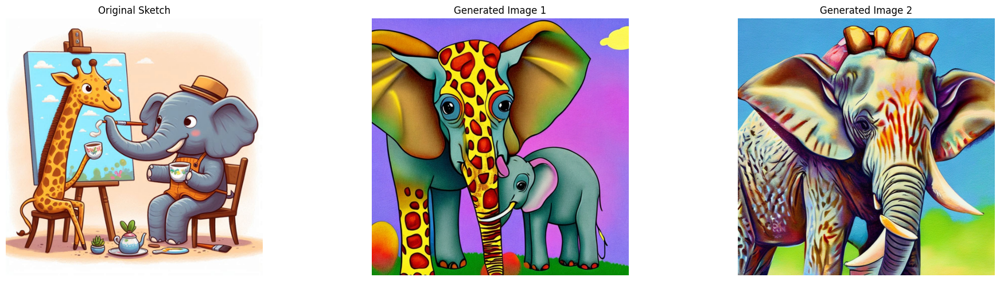

In [ ]:
prompt = "An elephant painting a picture of a giraffe, in a cute cartoon style, vibrant colors"
image_to_image(sketch_path="/content/test_diffusion.jpeg", prompt=prompt)

  0%|          | 0/70 [00:00<?, ?it/s]

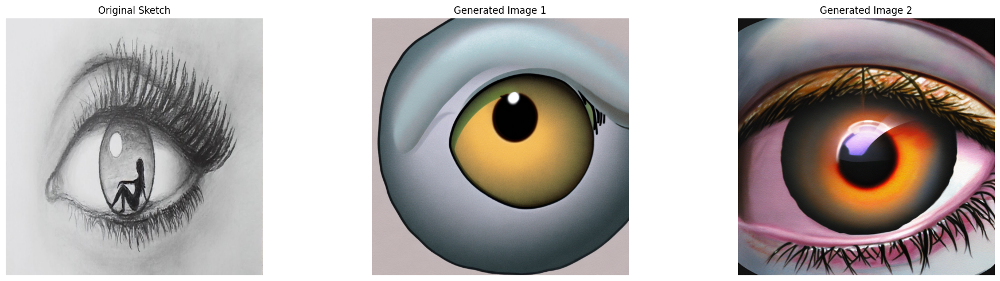

In [15]:
prompt = "An eye with a shadow of female sitting inside the eyeball, realistic, detailed, vibrant color"
image_to_image(sketch_path="/content/test_2.jpg", prompt=prompt)

  0%|          | 0/70 [00:00<?, ?it/s]

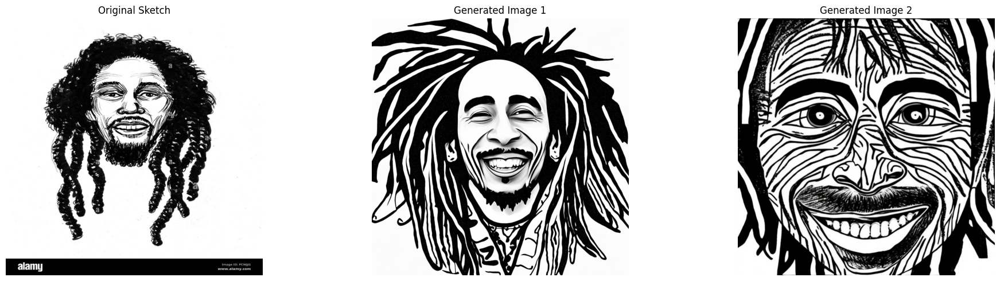

In [16]:
prompt = "Bob Marley face, smiling, trippy eye, caricature cartoon style, black and white"
image_to_image(sketch_path="/content/bobmarley.jpg", prompt=prompt)